# Prep for training

This is all what is discussed later on. For convenienve it's enough to run this function before any model, instead running whole notebook.

In [1]:
def prep_for_training():
  import zipfile
  from tensorflow.keras.preprocessing.image import ImageDataGenerator
  from tensorflow.keras.optimizers import Adam
  from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
  from tensorflow.keras import Sequential
  import tensorflow as tf

  !wget https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip

  # Unzip the downloaded file
  zip_ref = zipfile.ZipFile('pizza_steak.zip')
  zip_ref.extractall()
  zip_ref.close()

  # set the seed
  tf.random.set_seed(42)

  # Preprocessing data (get all of the pixel values between 0 & 1, scalling)
  train_datagen = ImageDataGenerator(rescale = 1./255)
  valid_datagen = ImageDataGenerator(rescale = 1./255)

  # Setup paths to our data directories
  train_dir = '/content/pizza_steak/train'
  test_dir = 'pizza_steak/test'

  # Import data from directories and turn it into batches
  train_data = train_datagen.flow_from_directory(directory = train_dir, 
                                                batch_size = 32,
                                                target_size = (224, 224),  # will reshape all images to given shape
                                                class_mode = 'binary',
                                                seed = 42) 

  test_data = valid_datagen.flow_from_directory(directory = test_dir,
                                                  batch_size = 32,
                                                  target_size = (224, 224),
                                                  class_mode = 'binary',
                                                  seed = 42)

# Introduction

## Types of problems based on comupter vision

* Classification of pictures
* Multiclass Classification of pictures
* Object Detection

## Architecture of Convolution Neural Network

 * Input image - Target images you'd like to discover patterns in
 * Input layer - Takes in target images and preprocesses them for further
 * Convolution Layer - Extracts/learns the most important features from target images
 * Hidden activation - Adds non-linearity to learned features (non-straight lines)
 * Pooling layer - Reduces the dimensionality of learned image feature
 * Fully connected layer - Further refines learned features from convolution layers
 * Output layer - Takes learned features and outputs them in shape of target labels
 * Output activation - Adds non-linearity to output layer

## Binary Classification Model

### Get data

Data is already preprocessed

In [2]:
import zipfile

!wget https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip

# Unzip the downloaded file
zip_ref = zipfile.ZipFile('pizza_steak.zip')
zip_ref.extractall()
zip_ref.close()


--2023-05-09 18:28:08--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.128, 74.125.24.128, 142.250.4.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip’

pizza_steak.zip     100%[===================>] 104.47M  21.8MB/s    in 5.7s    

2023-05-09 18:28:14 (18.2 MB/s) - ‘pizza_steak.zip’ saved [109540975/109540975]



### Exploratory Data Analysis

In [3]:
!ls pizza_steak/train/pizza

1008104.jpg  1638227.jpg  2235981.jpg  2774899.jpg  3464027.jpg  576236.jpg
1008144.jpg  1646974.jpg  2236914.jpg  2775763.jpg  3464858.jpg  5764.jpg
1008844.jpg  1649108.jpg  2241448.jpg  2778214.jpg  3473991.jpg  579691.jpg
1008941.jpg  1649276.jpg  2247711.jpg  277963.jpg   3475936.jpg  593400.jpg
1011404.jpg  1652943.jpg  2253670.jpg  2785084.jpg  3478964.jpg  59445.jpg
102037.jpg   1654444.jpg  2255361.jpg  2793535.jpg  3479875.jpg  596494.jpg
1026922.jpg  1660415.jpg  2274117.jpg  27963.jpg    3479936.jpg  598381.jpg
1029698.jpg  1663749.jpg  2279642.jpg  2800325.jpg  3484590.jpg  604977.jpg
1033251.jpg  1665654.jpg  2280345.jpg  2811032.jpg  3493457.jpg  608085.jpg
1035854.jpg  166823.jpg   2285269.jpg  282013.jpg   349946.jpg	 618021.jpg
1038357.jpg  1670471.jpg  2285942.jpg  2821034.jpg  350358.jpg	 61822.jpg
1040878.jpg  1671531.jpg  228778.jpg   2821048.jpg  3505182.jpg  618348.jpg
1044524.jpg  1678284.jpg  2291093.jpg  2827938.jpg  3512070.jpg  625687.jpg
1044789.jpg  16810

In [4]:
!ls pizza_steak/train/steak

1000205.jpg  1647351.jpg  2238681.jpg  2824680.jpg  3375959.jpg  417368.jpg
100135.jpg   1650002.jpg  2238802.jpg  2825100.jpg  3381560.jpg  4176.jpg
101312.jpg   165639.jpg   2254705.jpg  2826987.jpg  3382936.jpg  42125.jpg
1021458.jpg  1658186.jpg  225990.jpg   2832499.jpg  3386119.jpg  421476.jpg
1032846.jpg  1658443.jpg  2260231.jpg  2832960.jpg  3388717.jpg  421561.jpg
10380.jpg    165964.jpg   2268692.jpg  285045.jpg   3389138.jpg  438871.jpg
1049459.jpg  167069.jpg   2271133.jpg  285147.jpg   3393547.jpg  43924.jpg
1053665.jpg  1675632.jpg  227576.jpg   2855315.jpg  3393688.jpg  440188.jpg
1068516.jpg  1678108.jpg  2283057.jpg  2856066.jpg  3396589.jpg  442757.jpg
1068975.jpg  168006.jpg   2286639.jpg  2859933.jpg  339891.jpg	 443210.jpg
1081258.jpg  1682496.jpg  2287136.jpg  286219.jpg   3417789.jpg  444064.jpg
1090122.jpg  1684438.jpg  2291292.jpg  2862562.jpg  3425047.jpg  444709.jpg
1093966.jpg  168775.jpg   229323.jpg   2865730.jpg  3434983.jpg  447557.jpg
1098844.jpg  1697

In [5]:
import os 

# wlakt through pizza_steak dir and list number of files

for dirpath, dirnames, filenames in os.walk('pizza_steak'):
  print(f"there are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

there are 2 directories and 0 images in 'pizza_steak'.
there are 2 directories and 0 images in 'pizza_steak/test'.
there are 0 directories and 250 images in 'pizza_steak/test/steak'.
there are 0 directories and 250 images in 'pizza_steak/test/pizza'.
there are 2 directories and 0 images in 'pizza_steak/train'.
there are 0 directories and 750 images in 'pizza_steak/train/steak'.
there are 0 directories and 750 images in 'pizza_steak/train/pizza'.


In [6]:
num_steak_images_train = len(os.listdir('pizza_steak/train/steak'))
num_steak_images_train

750

#### Visualization

To visualize our images, first let's get the class names programmatically.

In [7]:
import pathlib
import numpy as np
data_dir = pathlib.Path('pizza_steak/train')
class_names = np.array(sorted([item.name for item in data_dir.glob('*')])) # created a list of class_names from the subdirectory
class_names

array(['pizza', 'steak'], dtype='<U5')

In [8]:
# Visuzalization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir, target_class):
  # Setup the target directory
  target_folder = target_dir + '/' + target_class

  # Get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)

  # Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder + '/' + random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis('off');

  print(f'Image name: {random_image[0]}')
  print(f'Image shape: {img.shape}') # show the shape of the image

  return img

Image name: 1433912.jpg
Image shape: (512, 512, 3)


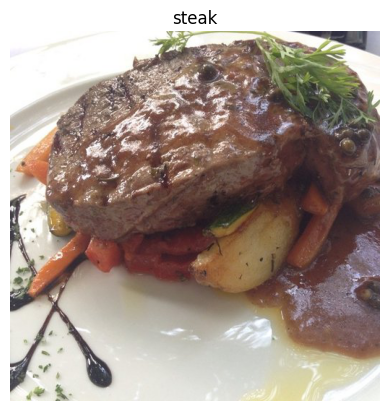

In [9]:
# View random image from the training dataset
img = view_random_image(target_dir = 'pizza_steak/train',
                        target_class = 'steak')

In [10]:
import tensorflow as tf
img_vectors = tf.constant(img)
img_vectors

<tf.Tensor: shape=(512, 512, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [181, 182, 200],
        [182, 183, 201],
        [183, 185, 200]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [179, 180, 198],
        [181, 182, 200],
        [182, 184, 199]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [178, 179, 197],
        [179, 180, 198],
        [181, 183, 198]],

       ...,

       [[229, 226, 217],
        [232, 229, 220],
        [236, 233, 224],
        ...,
        [245, 247, 242],
        [245, 247, 242],
        [246, 248, 243]],

       [[234, 230, 221],
        [236, 232, 223],
        [238, 234, 225],
        ...,
        [246, 248, 243],
        [247, 249, 244],
        [247, 249, 244]],

       [[238, 234, 225],
        [239, 235, 226],
        [240, 236, 227],
        ...,
        [248, 250, 24

In [11]:
512 * 512 * 3 # width, height, colour channels (rgb)

786432

As we can see above each image is a tensor, with values of each pixel. The one above has 785432 pixels in total

### Normalization

Since there are 255 possible rgb values we can simply divide by 255.

In [12]:
img/255.

array([[[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [0.70980392, 0.71372549, 0.78431373],
        [0.71372549, 0.71764706, 0.78823529],
        [0.71764706, 0.7254902 , 0.78431373]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [0.70196078, 0.70588235, 0.77647059],
        [0.70980392, 0.71372549, 0.78431373],
        [0.71372549, 0.72156863, 0.78039216]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [0.69803922, 0.70196078, 0.77254902],
        [0.70196078, 0.70588235, 0.77647059],
        [0.70980392, 0.71764706, 0.77647059]],

       ...,

       [[0.89803922, 0.88627451, 0.85098039],
        [0.90980392, 0.89803922, 0.8627451 ],
        [0.9254902 , 0

### Whole model

We need to:
* Load our images
* Preprocess our images
* Build a CNN to find patterns in our images
* Compile our CNN
* Fit the CNN to our training data

In [13]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# set the seed
tf.random.set_seed(42)

# Preprocessing data (get all of the pixel values between 0 & 1, scalling)
train_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

# Setup paths to our data directories
train_dir = '/content/pizza_steak/train'
test_dir = 'pizza_steak/test'

# Import data from directories and turn it into batches
train_data = train_datagen.flow_from_directory(directory = train_dir, 
                                               batch_size = 32,
                                               target_size = (224, 224),  # will reshape all images to given shape
                                               class_mode = 'binary',
                                               seed = 42) 

valid_data = valid_datagen.flow_from_directory(directory = test_dir,
                                                batch_size = 32,
                                                target_size = (224, 224),
                                                class_mode = 'binary',
                                                seed = 42)
 
 # Build a CNN model (same as the TINY VGG on the CNN explainer website)

model_1 = tf.keras.models.Sequential([
     tf.keras.layers.Conv2D(filters = 10,
                            kernel_size = 3,
                            activation = 'relu',
                            input_shape = (224, 224, 3)),
     tf.keras.layers.Conv2D(10, 3, activation = 'relu'), # this layer is exactly the same as the one above, just uses deafult values and args
     tf.keras.layers.MaxPool2D(pool_size = 2,
                               padding = 'valid'),
     tf.keras.layers.Conv2D(10, 3, activation = 'relu'),
     tf.keras.layers.MaxPool2D(2),
     tf.keras.layers.Flatten(),
     tf.keras.layers.Dense(1, activation = 'sigmoid')

 ])

# Compile our CNN

model_1.compile(
    loss = 'binary_crossentropy',
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ['accuracy']
)

# Fit
history_1 = model_1.fit(
    train_data,
    epochs = 5,
    steps_per_epoch = len(train_data), # it's 47 because we have 1500 images in training data and batch size is 32, 1500/32 is almost 47. And when we select steps_per_epoch = len(train_data) we simply say that the model should go through all train_data in single epoch. And YES apparently we can NOT to go through whole training dataset in single epoch, instead apparently we can go through e.g. 20% of training data in single epoch which is a bit confusing.
    validation_data = valid_data,
    validation_steps = len(valid_data)
)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/5
47/47 [==============================] - 21s 206ms/step - loss: 0.6314 - accuracy: 0.6307 - val_loss: 0.4257 - val_accuracy: 0.8200
Epoch 2/5
47/47 [==============================] - 9s 183ms/step - loss: 0.4423 - accuracy: 0.7953 - val_loss: 0.3939 - val_accuracy: 0.8080
Epoch 3/5
47/47 [==============================] - 9s 196ms/step - loss: 0.3906 - accuracy: 0.8260 - val_loss: 0.3696 - val_accuracy: 0.8340
Epoch 4/5
47/47 [==============================] - 9s 185ms/step - loss: 0.3842 - accuracy: 0.8360 - val_loss: 0.3158 - val_accuracy: 0.8720
Epoch 5/5
47/47 [==============================] - 9s 185ms/step - loss: 0.2979 - accuracy: 0.8780 - val_loss: 0.2973 - val_accuracy: 0.8740


In [14]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 10)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 29160)             0

**steps_per_epoch** = len(train_data)

it's 47 because we have 1500 images in training data and batch size is 32, 1500/32 is almost 47. And when we select steps_per_epoch = len(train_data) we simply say that the model should go through all train_data in single epoch. And YES apparently we can NOT to go through whole training dataset in single epoch, instead apparently we can go through e.g. 20% of training data in single epoch which is a bit confusing.
    

### CNN vs DNN

Let's now test the same data BUT on normal neural network, not convolutional neural network and then let's compare them.

In [15]:
# Set random seed
tf.random.set_seed(42)

# Create a model to replicate the Tensorflow Playground model
model_2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape= (224, 224, 3)),
    tf.keras.layers.Dense(100,activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(100,activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Compile the model
model_2.compile(loss = 'binary_crossentropy',
                optimizer = tf.keras.optimizers.Adam(),
                metrics = ['accuracy'])

# Fit the model 
history_2 = model_2.fit(train_data,
                        epochs = 5,
                        steps_per_epoch=len(train_data),
                        validation_data = valid_data,
                        validation_steps = len(valid_data))

Epoch 1/5
47/47 [==============================] - 10s 187ms/step - loss: 5.7041 - accuracy: 0.6100 - val_loss: 1.3231 - val_accuracy: 0.7480
Epoch 2/5
47/47 [==============================] - 9s 182ms/step - loss: 0.8451 - accuracy: 0.7227 - val_loss: 0.7534 - val_accuracy: 0.6280
Epoch 3/5
47/47 [==============================] - 8s 179ms/step - loss: 0.9536 - accuracy: 0.6893 - val_loss: 0.8190 - val_accuracy: 0.6840
Epoch 4/5
47/47 [==============================] - 9s 182ms/step - loss: 0.7213 - accuracy: 0.7273 - val_loss: 0.5220 - val_accuracy: 0.7720
Epoch 5/5
47/47 [==============================] - 8s 180ms/step - loss: 0.5015 - accuracy: 0.7767 - val_loss: 0.5194 - val_accuracy: 0.7700


In [16]:
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_1 (Dense)             (None, 100)               15052900  
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 dense_3 (Dense)             (None, 100)               10100     
                                                                 
 dense_4 (Dense)             (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


So here we want to compare CNN to usual neural DNN. As we can see CNN was over 20% better in accuracy. But what is most important CNN used only 31,261 parameters to get 83.6% of accuracy while DNN used 15,073,201 parameters to get just 63% of accuracy.

# Breaking CNN down into parts

1. EDA - Become one with the data (visualize)
2. Preprocess the data (prepare it for our model, the main step here was scalling/normalizing)
3. Create a model (start with a baseline)
4. Fit the model
5. Evaluate the model
6. Ajust different parameters and improve the model (try to beat out baseline)
7. Repeat until satisfied (experiment)

## EDA

Image name: 907107.jpg
Image shape: (512, 512, 3)
Image name: 2077999.jpg
Image shape: (512, 512, 3)


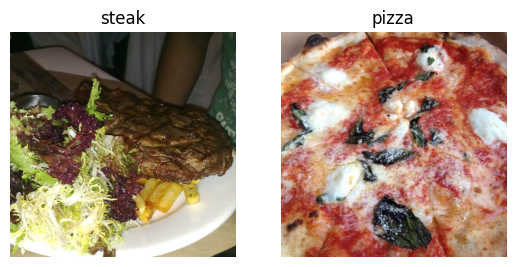

In [17]:
# Visualize data
plt.figure()
plt.subplot(1, 2, 1)
steak_img = view_random_image('pizza_steak/train/', 'steak')
plt.subplot(1, 2, 2)
pizza_img = view_random_image('pizza_steak/train/', 'pizza')

## 2. Preprocessing

In [18]:
# Define directory dataset paths
train_dir = 'pizza_steak/train/'
test_dir = 'pizza_steak/test/'

In next step we're going to create batches

A batch is a small subset of data. Rather than look at all ~10,000 images at one time, a model might only look at 32 at a time. 

It does this for a couple of reasons:

1. 10,000 images (or more) might not fit into the memory of your processor (GPU)
2. Trying to learn the patterns in 10,000 images in one hit could result in the mode

Why 32?

According to Yann LeCun 32 is biggest minibatch that should be used.

In [19]:
!nvidia-smi

Tue May  9 18:30:05 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P0    27W /  70W |   2911MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [20]:
# Create train and test data generators and rescale the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1/255.)
test_datagen = ImageDataGenerator(rescale = 1/255.)

In [21]:
# Load in our image data from directories and turn them into batches
train_data = train_datagen.flow_from_directory(directory = train_dir, # Target directory of images
                                               target_size = (224, 224), # Target size of images (height, widht)
                                               class_mode = 'binary', # Type of data you're working with
                                               batch_size = 32) # size of minibatches to load data into

# valid_data = ... # we can create here a validation data

test_data = test_datagen.flow_from_directory(directory = test_dir,
                                             target_size = (224, 224),
                                             class_mode = 'binary',
                                             batch_size = 32)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [22]:
# Get a sample of train data batch
images, labels = train_data.next() # get the "next" batch of images/labels in train data
len(images), len(labels)

(32, 32)

In [23]:
# How many batches are there?
len(train_data)

47

In [24]:
np.ceil(1500/32) # amount of images divided of batch count

47.0

In [25]:
# Get the first two images
images[:2], images[0].shape

(array([[[[0.1137255 , 0.11764707, 0.18823531],
          [0.1137255 , 0.11764707, 0.18823531],
          [0.10980393, 0.1137255 , 0.18431373],
          ...,
          [0.95294124, 0.9450981 , 0.9490197 ],
          [0.8235295 , 0.81568635, 0.8196079 ],
          [0.97647065, 0.9686275 , 0.9725491 ]],
 
         [[0.12156864, 0.1254902 , 0.19607845],
          [0.1254902 , 0.12941177, 0.20000002],
          [0.10196079, 0.10588236, 0.1764706 ],
          ...,
          [0.9333334 , 0.92549026, 0.9294118 ],
          [0.909804  , 0.90196085, 0.9058824 ],
          [0.9960785 , 0.98823535, 0.9921569 ]],
 
         [[0.09803922, 0.10196079, 0.17254902],
          [0.10588236, 0.10980393, 0.18039216],
          [0.1254902 , 0.13333334, 0.19215688],
          ...,
          [0.8000001 , 0.79215693, 0.7960785 ],
          [0.909804  , 0.90196085, 0.9058824 ],
          [1.        , 0.9960785 , 1.        ]],
 
         ...,
 
         [[0.09803922, 0.07843138, 0.09411766],
          [0.07843

In [26]:
images[7], images[7].shape

(array([[[0.07450981, 0.03137255, 0.02352941],
         [0.07843138, 0.03529412, 0.01960784],
         [0.09019608, 0.03529412, 0.02352941],
         ...,
         [0.03137255, 0.02745098, 0.01960784],
         [0.03529412, 0.03137255, 0.02352941],
         [0.03529412, 0.03137255, 0.02352941]],
 
        [[0.05882353, 0.03921569, 0.02352941],
         [0.07058824, 0.03921569, 0.02745098],
         [0.07450981, 0.04313726, 0.03137255],
         ...,
         [0.03529412, 0.03137255, 0.02352941],
         [0.03529412, 0.03137255, 0.02352941],
         [0.03529412, 0.03137255, 0.02352941]],
 
        [[0.06666667, 0.04705883, 0.03137255],
         [0.06666667, 0.04705883, 0.03137255],
         [0.07450981, 0.04313726, 0.03137255],
         ...,
         [0.03529412, 0.03137255, 0.02352941],
         [0.03921569, 0.03529412, 0.02745098],
         [0.03921569, 0.03529412, 0.02745098]],
 
        ...,
 
        [[0.29803923, 0.3137255 , 0.31764707],
         [0.3137255 , 0.32941177, 0.33333

In [27]:
# View the first batch of labels
labels

array([0., 1., 0., 1., 1., 0., 0., 1., 1., 1., 1., 0., 1., 1., 0., 1., 0.,
       1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 0., 0., 0.],
      dtype=float32)

## 3. Create a model

A baseline is a relatively simple model or existing result that you setup when beggining a mechine learning experiment and then as you keep experimenting you try to beat the baseline.

In deep learning, there is almost infinite amount of architectures you could create. So one of the best ways to get started is to start with something simple and see if it works on your data and then introduce complexity as required (e.g. look at which current model is performing best in the field for your problem).

In [28]:
 # Make the creating of our model a little easier
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

In [29]:
# Create the model (this will be our baseline, a layer convolutional neural network)
model_4 = Sequential([
    Conv2D(filters = 10, # filter is the number of sliding windows goind across and input (higher = more complex model)
           kernel_size = 3, # it's the same as (3,3)
           strides = 1, # if padding is equal to stride, we won't compress the output, will be the same size as input shape
           padding = 'valid', # if 'same', output shape is same as input shae, if 'valid', output shae gets compressed
           activation = 'relu',
           input_shape = (224, 224, 3)), # input layer (specify input shape)
    Conv2D(10, 3, activation = 'relu'),
    Conv2D(10, 3 , activation = 'relu'),
    Flatten(),
    Dense(1, activation = 'sigmoid') # output layer (working with binary classification)
])

model_4.compile(
    loss = tf.keras.losses.binary_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ['accuracy']
)

history_4 = model_4.fit(
                        train_data, # this is a combination of labels and sample data. fit method is smart enough to figure it out
                        epochs = 5,
                        steps_per_epoch = len(train_data),
                        validation_data = valid_data,
                        validation_steps = len(valid_data)
)

Epoch 1/5
47/47 [==============================] - 11s 196ms/step - loss: 0.9376 - accuracy: 0.6133 - val_loss: 0.4518 - val_accuracy: 0.7820
Epoch 2/5
47/47 [==============================] - 9s 182ms/step - loss: 0.4166 - accuracy: 0.8133 - val_loss: 0.3773 - val_accuracy: 0.8460
Epoch 3/5
47/47 [==============================] - 9s 186ms/step - loss: 0.2803 - accuracy: 0.9027 - val_loss: 0.4323 - val_accuracy: 0.7980
Epoch 4/5
47/47 [==============================] - 9s 186ms/step - loss: 0.2011 - accuracy: 0.9407 - val_loss: 0.3728 - val_accuracy: 0.8460
Epoch 5/5
47/47 [==============================] - 9s 181ms/step - loss: 0.0954 - accuracy: 0.9813 - val_loss: 0.4049 - val_accuracy: 0.8260


## 4. Evaluate

### Plot training curves

<Axes: >

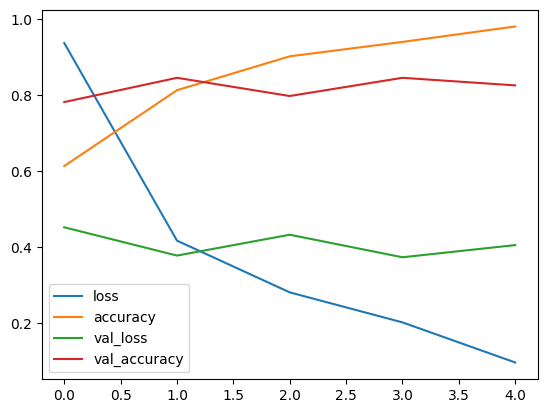

In [30]:
import pandas as pd
pd.DataFrame(history_4.history).plot()

Plot validation and training curver separately

In [31]:
history_4.history

{'loss': [0.9375901818275452,
  0.41664159297943115,
  0.2802871763706207,
  0.20114608108997345,
  0.09541486948728561],
 'accuracy': [0.6133333444595337,
  0.8133333325386047,
  0.9026666879653931,
  0.940666675567627,
  0.981333315372467],
 'val_loss': [0.451825350522995,
  0.3773205280303955,
  0.4322802722454071,
  0.37281304597854614,
  0.4049187898635864],
 'val_accuracy': [0.7820000052452087,
  0.8460000157356262,
  0.7979999780654907,
  0.8460000157356262,
  0.8259999752044678]}

In [32]:
def plot_loss_accuracy_curves(history):
  """
  Returns separate loss curves for training and validation metrics
  """

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label = 'training_loss')
  plt.plot(epochs, val_loss, label = 'val_loss')
  plt.title('loss')
  plt.xlabel('epochs')
  plt.legend()

  # Plot accuracy
  plt.figure() # this will create a new  plot figure
  plt.plot(epochs, accuracy, label = 'training_accuracy')
  plt.plot(epochs, val_accuracy, label = 'loss_accuracy')
  plt.title('accuracy')
  plt.xlabel('epochs')
  plt.legend()

  plt.show()

When a model's **validation loss starts to increase**, it's likely that the model is **overfitting** the training dataset. 

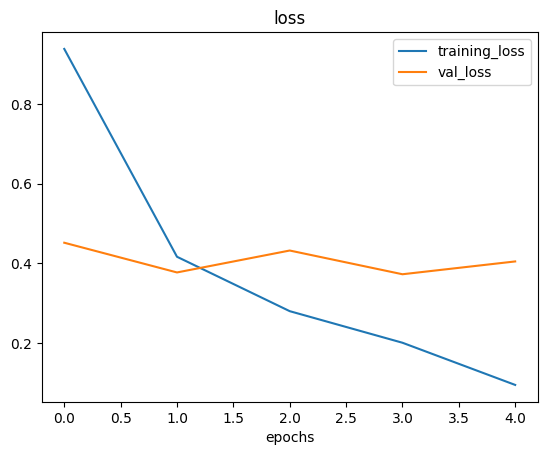

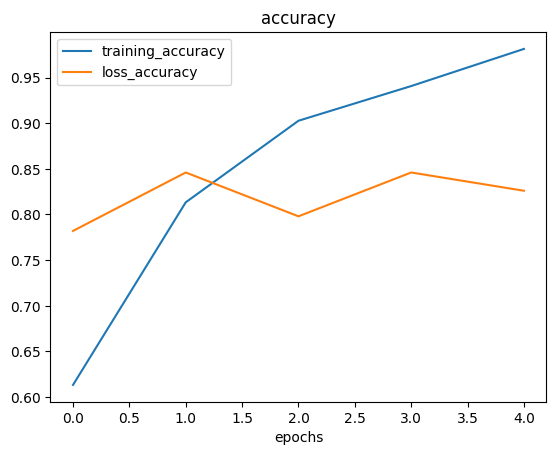

In [33]:
plot_loss_accuracy_curves(history_4)

### model.evaluate

In [34]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 10)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 29160)             0

In [35]:
model_4.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_4 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_5 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_2 (Flatten)         (None, 475240)            0         
                                                                 
 dense_5 (Dense)             (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [36]:
model_1.evaluate(test_data)

16/16 [==============================] - 2s 135ms/step - loss: 0.2973 - accuracy: 0.8740


[0.29725539684295654, 0.8740000128746033]

In [37]:
model_2.evaluate(test_data)

16/16 [==============================] - 2s 127ms/step - loss: 0.5194 - accuracy: 0.7700


[0.5193802118301392, 0.7699999809265137]

In [38]:
model_4.evaluate(test_data)

16/16 [==============================] - 2s 137ms/step - loss: 0.4049 - accuracy: 0.8260


[0.40491876006126404, 0.8259999752044678]

model_1 is performing better, we used there max_pooling which basically takes out most important features from filter.

## Reducing Overfitting - Regularization

Fitting a machine learning model comes in 3 steps

0. Creating Baseline
1. Beat a baseline by overfitting a larger model
2. Reduce Overfitting

Ways to increase overfitting

* Increase the number of conv layers
* Increase the number of conv filters
* Add another dense layer to the output of our flattened layer

Ways to reduce overfitting:

* Add data augmentation
* Add redulatization layers (sucha as MaxPool2D)
* Add more data...


**Reducing overfitting is also known as regularization** 

### MaxPool2D

In [39]:
# Create the model (this is going to be our new baseline)

model_5 = Sequential([
    Conv2D(10, 3, activation = 'relu', input_shape = (224, 224, 3)),
    MaxPool2D(pool_size = 2),
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation = 'sigmoid')
])

In [40]:
model_5.compile(loss = 'binary_crossentropy',
                optimizer = Adam(),
                metrics = ['accuracy'])

In [41]:
history_5 = model_5.fit(train_data,
                        epochs = 5,
                        steps_per_epoch = len(train_data),
                        validation_data = test_data,
                        validation_steps = len(valid_data))

Epoch 1/5
47/47 [==============================] - 11s 192ms/step - loss: 0.6325 - accuracy: 0.6373 - val_loss: 0.4896 - val_accuracy: 0.7620
Epoch 2/5
47/47 [==============================] - 9s 182ms/step - loss: 0.4720 - accuracy: 0.7860 - val_loss: 0.3831 - val_accuracy: 0.8260
Epoch 3/5
47/47 [==============================] - 8s 179ms/step - loss: 0.4395 - accuracy: 0.7987 - val_loss: 0.3548 - val_accuracy: 0.8600
Epoch 4/5
47/47 [==============================] - 9s 184ms/step - loss: 0.3931 - accuracy: 0.8233 - val_loss: 0.3343 - val_accuracy: 0.8680
Epoch 5/5
47/47 [==============================] - 8s 180ms/step - loss: 0.3810 - accuracy: 0.8440 - val_loss: 0.3721 - val_accuracy: 0.8320


In [42]:
model_5.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 10)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 10)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 52, 52, 10)        910       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 10)      

In [43]:
model_4.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_4 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_5 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_2 (Flatten)         (None, 475240)            0         
                                                                 
 dense_5 (Dense)             (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


By MaxPooling we were able to decrease total params

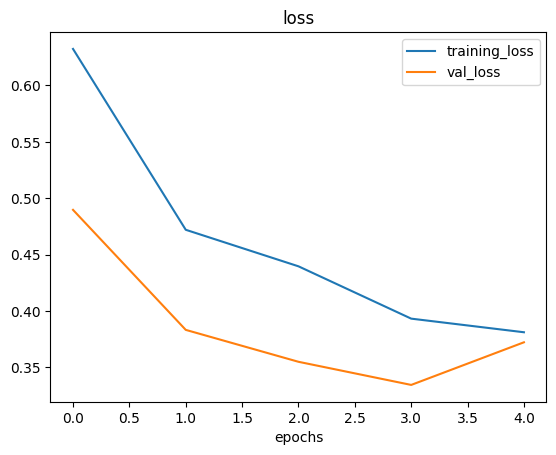

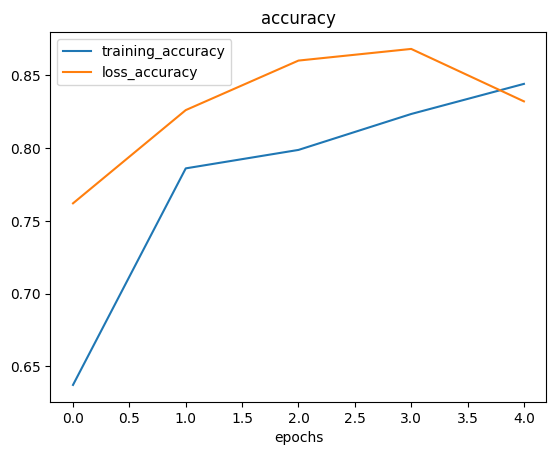

In [44]:
plot_loss_accuracy_curves(history_5)

We have much better performance of loass and accuracy after implementing MaxPooling2D

### Data Augmentation

#### Augmentation

In [45]:
prep_for_training()

--2023-05-09 18:31:45--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.128, 74.125.24.128, 142.250.4.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip.1’

pizza_steak.zip.1   100%[===================>] 104.47M  22.3MB/s    in 6.0s    

2023-05-09 18:31:51 (17.4 MB/s) - ‘pizza_steak.zip.1’ saved [109540975/109540975]

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [46]:
# Create ImageDataGenerator training instance with data augmentation
train_datagen_augmented = ImageDataGenerator(rescale = 1/255.,
                                             # all of features below are generated randomly, so one image can by rotated by 0.2, one can be sheared by 0.2, another can be horizontally flipped and zoomed by 0.2
                                             rotation_range=0.2, # how much do we want to rotate the image
                                             shear_range = 0.2, # how much do you want to cut and image
                                             zoom_range = 0.2, # how much zoom do you want to use
                                             width_shift_range = 0.2, # how much do you want to move an image horizontaly
                                             height_shift_range = 0.2, # how much do you want to move an image vertically
                                             horizontal_flip = True) # do you want to flip

# Create ImageDataGenerator without data augmentation
train_datagen = ImageDataGenerator(rescale = 1/255.)

# Create ImageDataGenerator without data augmentation for the test dataset
test_datagen = ImageDataGenerator(rescale = 1/255.)

What is data augmentation?

Data augmentation is the process of altering our training data, leading it to have more diversity and in turn allowing our models to learn more generalizable (hopefully) patterns. Altering might mean adjusting the rotation of an image, flipping it, cropping it or something similar.

Let's write some code to visualize image augmentation

In [47]:
print('Augmented training data')
train_data_augmented = train_datagen_augmented.flow_from_directory(
    train_dir, # directory
    target_size = (224, 224),
    batch_size = 32,
    class_mode = 'binary',
    shuffle = False # just for demonstration purposes
) # takes the path to a directory and generates the batches of augmented data


print('Not-augmented training data')
train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size = (224, 224),
    batch_size = 32,
    class_mode = 'binary',
    shuffle = False
)

print('Non-augmented testing data')
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size = (224,224),
    batch_size = 32,
    class_mode = 'binary' 
)

Augmented training data
Found 1500 images belonging to 2 classes.
Not-augmented training data
Found 1500 images belonging to 2 classes.
Non-augmented testing data
Found 500 images belonging to 2 classes.


Data augmentation is usually performed only on training data.

Let's now see our augmented data

In [48]:
train_images, train_labels = train_data.next()
augmented_train_images, augmented_train_labels = train_data_augmented.next()
test_images, test_labels = test_data.next()

Image number 10


(-0.5, 223.5, 223.5, -0.5)

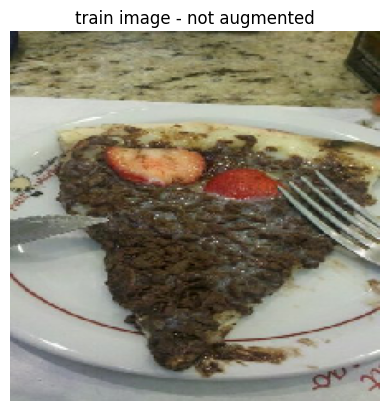

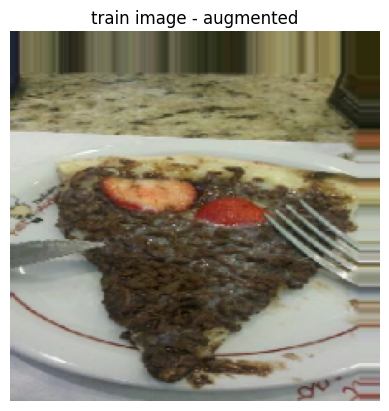

In [49]:
import random

img_idx = random.randint(0, 32) # because we have batch_size = 32

# because we set shuffle = false we will receive same img by img_idx because all images were uploaded in sequential order

print('Image number', img_idx)
plt.imshow(train_images[img_idx])
plt.title('train image - not augmented')
plt.axis(False)
plt.figure()
plt.imshow(augmented_train_images[img_idx])
plt.title('train image - augmented')
plt.axis(False)

Basically the image looks differently, augmentation of the image is same when human is trying to take a look on a object. We tend to rotate the object, bring it closer, a bit further to understand and memorize it better. Same in augmentation model is turning the image in some directions to get a better look.

#### Running a model on augmented data

In [50]:
model_6 = Sequential([
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation = 'sigmoid')
])

model_6.compile(
    loss = 'binary_crossentropy',
    optimizer = Adam(),
    metrics = ['accuracy']
)

history_6 = model_6.fit(
    train_data_augmented,
    epochs = 5,
    steps_per_epoch = len(train_data),
    validation_data = test_data,
    validation_steps = len(test_data)
)

Epoch 1/5
47/47 [==============================] - 22s 440ms/step - loss: 0.7222 - accuracy: 0.4193 - val_loss: 0.6903 - val_accuracy: 0.5740
Epoch 2/5
47/47 [==============================] - 21s 439ms/step - loss: 0.6940 - accuracy: 0.5073 - val_loss: 0.6838 - val_accuracy: 0.6660
Epoch 3/5
47/47 [==============================] - 21s 439ms/step - loss: 0.7981 - accuracy: 0.5447 - val_loss: 0.6862 - val_accuracy: 0.5840
Epoch 4/5
47/47 [==============================] - 21s 444ms/step - loss: 0.6916 - accuracy: 0.5473 - val_loss: 0.6845 - val_accuracy: 0.6580
Epoch 5/5
47/47 [==============================] - 21s 445ms/step - loss: 0.6941 - accuracy: 0.5547 - val_loss: 0.6779 - val_accuracy: 0.5020


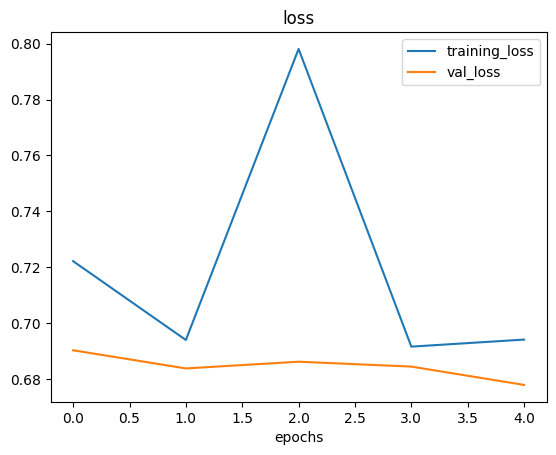

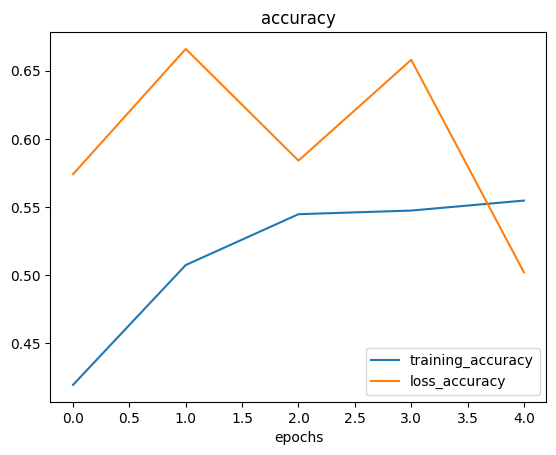

In [51]:
plot_loss_accuracy_curves(history_6)

* Our model takes much longer time for each epoch, and thats because images are augmented on the fly so it takes more computation power than just simply uploading the data
* Our model didn't perform well it might be because to many or to less augmentation techniques used or maybe because we used not shuffled dataset.

Let's create new model same as before but with shuffled data while augmenting

#### Model 2

In [52]:
prep_for_training()
import zipfile
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential
import tensorflow as tf

--2023-05-09 18:34:00--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.200.128, 74.125.68.128, 74.125.24.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.200.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip.2’

pizza_steak.zip.2   100%[===================>] 104.47M  22.6MB/s    in 6.0s    

2023-05-09 18:34:06 (17.5 MB/s) - ‘pizza_steak.zip.2’ saved [109540975/109540975]

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [53]:
train_datagen_augmented_2 = ImageDataGenerator(rescale = 1 / 255.,
                                               rotation_range = 0.2,
                                               shear_range = 0.2,
                                               zoom_range = 0.2,
                                               width_shift_range = 0.2,
                                               height_shift_range = 0.2,
                                               horizontal_flip = True)

train_data_augmented_2 = train_datagen_augmented_2.flow_from_directory(train_dir,
                                                                     batch_size = 32,
                                                                     target_size = (224,224),
                                                                     class_mode = 'binary',
                                                                     shuffle = True)
# train_datagen and test_datagen are same as before

model_7 = tf.keras.Sequential([
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation = 'relu'),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation = 'sigmoid')
])

model_7.compile(
    loss = 'binary_crossentropy',
    optimizer = Adam(),
    metrics = ['accuracy']
)

history_7 = model_7.fit(train_data_augmented_2, # here we used shuffled augmented data
                        epochs = 5,
                        steps_per_epoch = len(train_data),
                        validation_data = test_data,
                        validation_steps = len(test_data))

Found 1500 images belonging to 2 classes.
Epoch 1/5
47/47 [==============================] - 22s 436ms/step - loss: 0.6332 - accuracy: 0.6280 - val_loss: 0.4621 - val_accuracy: 0.7960
Epoch 2/5
47/47 [==============================] - 21s 446ms/step - loss: 0.5354 - accuracy: 0.7333 - val_loss: 0.3993 - val_accuracy: 0.8540
Epoch 3/5
47/47 [==============================] - 21s 444ms/step - loss: 0.4862 - accuracy: 0.7767 - val_loss: 0.3568 - val_accuracy: 0.8400
Epoch 4/5
47/47 [==============================] - 21s 439ms/step - loss: 0.5043 - accuracy: 0.7527 - val_loss: 0.3673 - val_accuracy: 0.8360
Epoch 5/5
47/47 [==============================] - 21s 448ms/step - loss: 0.4829 - accuracy: 0.7760 - val_loss: 0.3684 - val_accuracy: 0.8540


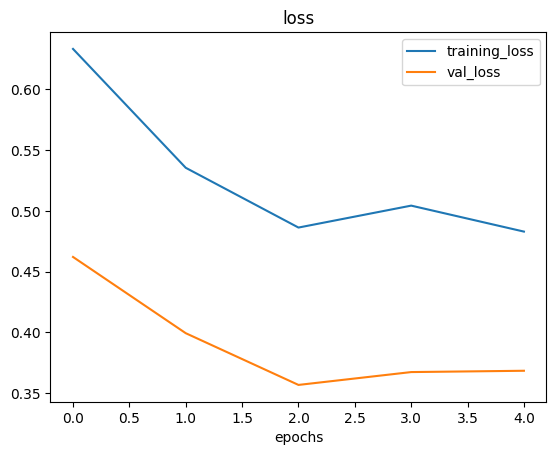

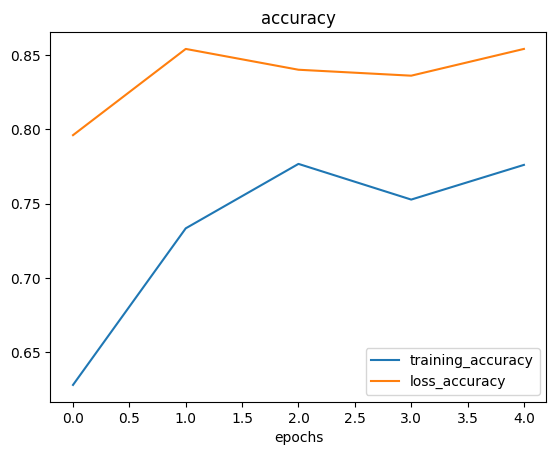

In [54]:
plot_loss_accuracy_curves(history_7)

Now, why shuffeling improved our model so much? So we have 2 classes pizza and steak. When we don't shuffle the data model simply goes through two directories,firsty through pizza directory the through steak directory. So, firstly model train itself on pizza's images then on steaks images. What is wrong with this approach is that model will be trained well on pizza recognition and then it will start adjusting parameters to learn detecting steaks images. That is not effective, model should randomly goes through pizza and steak images so it will get better recognition what is what, instead knowing first what is pizza very well and have no idea what steak is. That is why we should every time shuffle the data while training.

# Binary Classification - Making prediction on own images of pizza and steak

### Uploading an image

In [55]:
# check the classes
print(class_names)

['pizza' 'steak']


In [56]:
# download the photo
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg

--2023-05-09 18:35:54--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1978213 (1.9M) [image/jpeg]
Saving to: ‘03-steak.jpeg’

03-steak.jpeg       100%[===================>]   1.89M  --.-KB/s    in 0.007s  

2023-05-09 18:35:54 (270 MB/s) - ‘03-steak.jpeg’ saved [1978213/1978213]



(-0.5, 3023.5, 4031.5, -0.5)

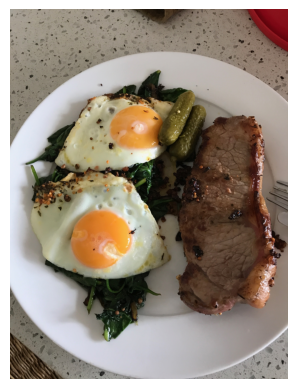

In [57]:
# display photo
import matplotlib.image as mpimg # for reading image
import matplotlib.pyplot as plt # for displaying image
steak = mpimg.imread('03-steak.jpeg')
plt.imshow(steak)
plt.axis(False)

In [58]:
steak.shape

(4032, 3024, 3)

In [59]:
steak

array([[[162, 158, 149],
        [163, 159, 150],
        [166, 162, 153],
        ...,
        [136,  17,  23],
        [140,  21,  27],
        [140,  21,  27]],

       [[164, 160, 151],
        [164, 160, 151],
        [164, 160, 151],
        ...,
        [133,  14,  20],
        [134,  15,  21],
        [137,  18,  24]],

       [[166, 162, 153],
        [165, 161, 152],
        [163, 159, 150],
        ...,
        [136,  17,  23],
        [134,  15,  21],
        [136,  17,  23]],

       ...,

       [[154, 132, 109],
        [142, 122,  98],
        [101,  80,  59],
        ...,
        [165, 154, 148],
        [152, 141, 135],
        [140, 129, 123]],

       [[141, 119,  95],
        [139, 117,  93],
        [106,  86,  62],
        ...,
        [158, 147, 141],
        [142, 131, 125],
        [138, 127, 121]],

       [[148, 127, 100],
        [149, 127, 103],
        [114,  94,  70],
        ...,
        [153, 142, 136],
        [138, 127, 121],
        [145, 132, 126]]

Our photo is uploaded as an array

### Load and preprocess the new image

Before we imput our photo to the model we need to preprocess it into the same format as the input data on which model was trained on.

In [60]:
def load_and_prep_image(filename, img_shape = 224):
  """
  Reads an image from an output and turns it into tensor and reshapes it
  to (img_shape, img_shape, colour_channels)
  """

  # Read in the image
  img = tf.io.read_file(filename)
  # Decode the read file into image
  img = tf.image.decode_image(img)
  # Changes shape of image tensor into desired shape
  img = tf.image.resize(img, size = [img_shape, img_shape])
  # Rescaling
  img = img / 255.

  return img

Let's break it down

In [61]:
img = tf.io.read_file('03-steak.jpeg') # Just reads the file as it is, without any parsing. Usually it's the first stape of the input pipeline
img

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00H\x00H\x00\x00\xff\xe1\x07vExif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x08\x01\x0f\x00\x02\x00\x00\x00\x06\x00\x00\x00n\x01\x10\x00\x02\x00\x00\x00\t\x00\x00\x00t\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00~\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\x86\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x05\x00\x00\x00\x8e\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\x94\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xa8\x00\x00\x00\x00Apple\x00iPhone 7\x00\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x0113.3\x00\x002020:01:14 14:23:00\x00\x00"\x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x02F\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x02N\x88"\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x88\'\x00\x03\x00\x00\x00\x01\x00@\x00\x00\x90\x00\x00\x07\x00\x00\x00\x040231\x90\x03\x00\x02\x00\x00\x00\x14\x00\x00\x02V\x90\x04\x00\x02\x00\x00\x00\x14\x00\x00\x02j\x90\x10\x00\x02\x00\x00\x00\x07\x

In [62]:
img = tf.image.decode_image(img) # decodes an image to a tensor
img

<tf.Tensor: shape=(4032, 3024, 3), dtype=uint8, numpy=
array([[[162, 158, 149],
        [163, 159, 150],
        [165, 161, 152],
        ...,
        [134,  18,  21],
        [138,  22,  25],
        [138,  22,  25]],

       [[163, 159, 150],
        [163, 159, 150],
        [164, 160, 151],
        ...,
        [130,  14,  17],
        [131,  15,  18],
        [134,  18,  21]],

       [[165, 161, 152],
        [165, 161, 152],
        [163, 159, 150],
        ...,
        [133,  16,  22],
        [132,  15,  21],
        [133,  16,  22]],

       ...,

       [[151, 131, 107],
        [140, 120,  96],
        [ 99,  81,  59],
        ...,
        [164, 155, 146],
        [151, 142, 133],
        [139, 130, 121]],

       [[139, 117,  93],
        [136, 116,  91],
        [103,  85,  61],
        ...,
        [156, 147, 138],
        [141, 131, 122],
        [138, 128, 119]],

       [[146, 125,  98],
        [147, 127, 100],
        [113,  93,  69],
        ...,
        [152, 143, 

In [63]:
img = tf.image.resize(img, size = [224, 224]) # changes shape of image tensor into desired shape, ours was 224, 224

In [64]:
img = img/255. # we need to rescale our image so it will have values from 0 to 1, instead of having values from 1 to 255
img

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.6377451 , 0.6220588 , 0.57892156],
        [0.6504902 , 0.63186276, 0.5897059 ],
        [0.63186276, 0.60833335, 0.5612745 ],
        ...,
        [0.52156866, 0.05098039, 0.09019608],
        [0.49509802, 0.04215686, 0.07058824],
        [0.52843136, 0.07745098, 0.10490196]],

       [[0.6617647 , 0.6460784 , 0.6107843 ],
        [0.6387255 , 0.6230392 , 0.57598037],
        [0.65588236, 0.63235295, 0.5852941 ],
        ...,
        [0.5352941 , 0.06862745, 0.09215686],
        [0.529902  , 0.05931373, 0.09460784],
        [0.5142157 , 0.05539216, 0.08676471]],

       [[0.6519608 , 0.6362745 , 0.5892157 ],
        [0.6392157 , 0.6137255 , 0.56764704],
        [0.65637255, 0.6269608 , 0.5828431 ],
        ...,
        [0.53137255, 0.06470589, 0.08039216],
        [0.527451  , 0.06862745, 0.1       ],
        [0.52254903, 0.05196078, 0.0872549 ]],

       ...,

       [[0.49313724, 0.42745098, 0.31029412],
        [0.05

Now let's preprocess the img and predict with model_7

In [65]:
steak = load_and_prep_image('03-steak.jpeg')
steak

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.6377451 , 0.6220588 , 0.57892156],
        [0.6504902 , 0.63186276, 0.5897059 ],
        [0.63186276, 0.60833335, 0.5612745 ],
        ...,
        [0.52156866, 0.05098039, 0.09019608],
        [0.49509802, 0.04215686, 0.07058824],
        [0.52843136, 0.07745098, 0.10490196]],

       [[0.6617647 , 0.6460784 , 0.6107843 ],
        [0.6387255 , 0.6230392 , 0.57598037],
        [0.65588236, 0.63235295, 0.5852941 ],
        ...,
        [0.5352941 , 0.06862745, 0.09215686],
        [0.529902  , 0.05931373, 0.09460784],
        [0.5142157 , 0.05539216, 0.08676471]],

       [[0.6519608 , 0.6362745 , 0.5892157 ],
        [0.6392157 , 0.6137255 , 0.56764704],
        [0.65637255, 0.6269608 , 0.5828431 ],
        ...,
        [0.53137255, 0.06470589, 0.08039216],
        [0.527451  , 0.06862745, 0.1       ],
        [0.52254903, 0.05196078, 0.0872549 ]],

       ...,

       [[0.49313724, 0.42745098, 0.31029412],
        [0.05

In [66]:
model_7.predict(tf.expand_dims(img, axis = 0)) # we need to expand dims because we're using 4 dims input training data not 3 dims

1/1 [==============================] - 0s 173ms/step


array([[0.8971165]], dtype=float32)

Above array returns probability of belonging of image to one of the class. We have binary problem, so if the probability is >= 0.5 then it will return class 1, if it's < 0.5 it will return class 0. Let's write a code for detecting actual name of the class.

In [67]:
img = tf.expand_dims(img, axis = 0) # we need to expand_dim so we will receive 4 dimensions instead of 3 for model purposes
img

<tf.Tensor: shape=(1, 224, 224, 3), dtype=float32, numpy=
array([[[[0.6377451 , 0.6220588 , 0.57892156],
         [0.6504902 , 0.63186276, 0.5897059 ],
         [0.63186276, 0.60833335, 0.5612745 ],
         ...,
         [0.52156866, 0.05098039, 0.09019608],
         [0.49509802, 0.04215686, 0.07058824],
         [0.52843136, 0.07745098, 0.10490196]],

        [[0.6617647 , 0.6460784 , 0.6107843 ],
         [0.6387255 , 0.6230392 , 0.57598037],
         [0.65588236, 0.63235295, 0.5852941 ],
         ...,
         [0.5352941 , 0.06862745, 0.09215686],
         [0.529902  , 0.05931373, 0.09460784],
         [0.5142157 , 0.05539216, 0.08676471]],

        [[0.6519608 , 0.6362745 , 0.5892157 ],
         [0.6392157 , 0.6137255 , 0.56764704],
         [0.65637255, 0.6269608 , 0.5828431 ],
         ...,
         [0.53137255, 0.06470589, 0.08039216],
         [0.527451  , 0.06862745, 0.1       ],
         [0.52254903, 0.05196078, 0.0872549 ]],

        ...,

        [[0.49313724, 0.42745098, 

### Returning actual class name of an image

In [68]:
pred = model_7.predict(img)
pred

1/1 [==============================] - 0s 20ms/step


array([[0.8971165]], dtype=float32)

In [69]:
class_names

array(['pizza', 'steak'], dtype='<U5')

In [70]:
class_names[int(tf.round(pred))]

'steak'

Here we took rounded probability of prediction and took correct index from class_names

In [71]:
pred_class = class_names[int(tf.round(pred))]
pred_class

'steak'

In [72]:
def pred_and_plot(model, filename, class_names = class_names):
  """
  Imports and image located in filename, makes a prediction with model
  and plots the image with the predicted class and title
  """
  # Import the targeted image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model_7.predict(tf.expand_dims(img, axis = 0))

  # Get the predicted class
  pred_class = class_names[int(tf.round(pred))]

  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False)

1/1 [==============================] - 0s 28ms/step


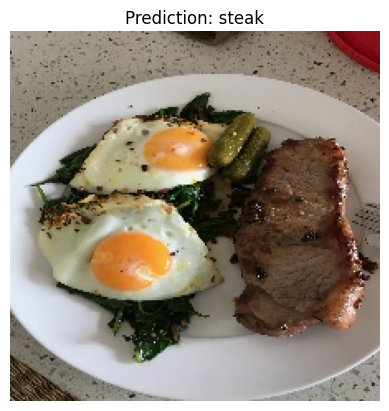

In [73]:
pred_and_plot(model_7, '03-steak.jpeg', class_names)

Our model works! Let's try it on different image

### Testing other images

In [74]:
!wget 'https://poprostupycha.com.pl/wp-content/uploads/2020/04/pizza-domowa_9.jpg'

--2023-05-09 18:35:57--  https://poprostupycha.com.pl/wp-content/uploads/2020/04/pizza-domowa_9.jpg
Resolving poprostupycha.com.pl (poprostupycha.com.pl)... 104.21.89.181, 172.67.190.141, 2606:4700:3030::6815:59b5, ...
Connecting to poprostupycha.com.pl (poprostupycha.com.pl)|104.21.89.181|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 835821 (816K) [image/jpeg]
Saving to: ‘pizza-domowa_9.jpg’

pizza-domowa_9.jpg  100%[===================>] 816.23K  1.27MB/s    in 0.6s    

2023-05-09 18:35:59 (1.27 MB/s) - ‘pizza-domowa_9.jpg’ saved [835821/835821]



1/1 [==============================] - 0s 22ms/step


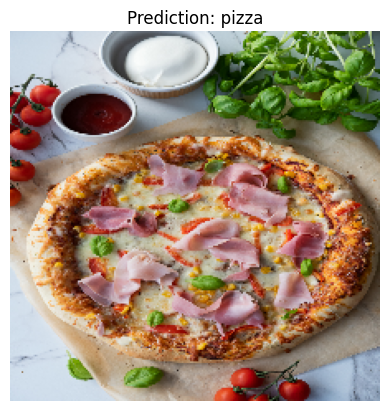

In [75]:
pred_and_plot(model_7, 'pizza-domowa_9.jpg')

In [76]:
!wget 'https://images.squarespace-cdn.com/content/v1/5a3756f1a8b2b0c3e92f6709/1571790210141-YW0KDELQSZLZ8DAMK95M/grassfed-beef-arm-roast-meal.jpg?format=2500w'

--2023-05-09 18:36:00--  https://images.squarespace-cdn.com/content/v1/5a3756f1a8b2b0c3e92f6709/1571790210141-YW0KDELQSZLZ8DAMK95M/grassfed-beef-arm-roast-meal.jpg?format=2500w
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 151.101.0.238, 151.101.64.238, 151.101.128.238, ...
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|151.101.0.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 386809 (378K) [image/jpeg]
Saving to: ‘grassfed-beef-arm-roast-meal.jpg?format=2500w’

grassfed-beef-arm-r 100%[===================>] 377.74K  --.-KB/s    in 0.005s  

2023-05-09 18:36:00 (79.1 MB/s) - ‘grassfed-beef-arm-roast-meal.jpg?format=2500w’ saved [386809/386809]



1/1 [==============================] - 0s 17ms/step


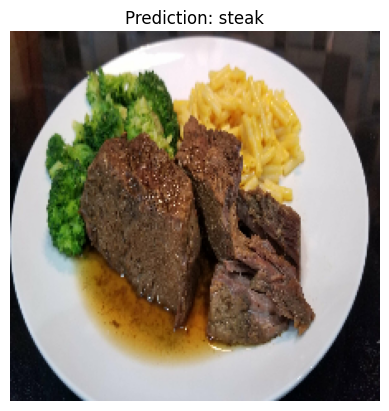

In [77]:
pred_and_plot(model_7, "grassfed-beef-arm-roast-meal.jpg?format=2500w")

Awesome!!! Our model works on never seen before images!

# Multiclass Classification

## General Steps

0. Prepare the data
1. Import the data
2. Become tne one with the data
3. Preprocess the data (get it ready for the model)
4. Create the model (start with the baseline)
5. Fit the model (overfit it to make sure it works)
6. Evaluate the model
7. Adjust different hyperparameters and improve the model (try to beat baseline/reduce overfitting)
8. Repeat until satisfied

## Preapare the data

Full process of creating training dataset is located up here: https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/image_data_modification.ipynb

## Import the data

In [78]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue May  9 18:36:00 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P0    29W /  70W |   2911MiB / 15360MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [79]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [80]:
import zipfile

!wget 'https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip'

zip_ref = zipfile.ZipFile('10_food_classes_all_data.zip', 'r')
zip_ref.extractall()
zip_ref.close()

--2023-05-09 18:36:01--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.128, 74.125.24.128, 142.250.4.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip’

10_food_classes_all 100%[===================>] 495.13M  23.3MB/s    in 22s     

2023-05-09 18:36:23 (22.2 MB/s) - ‘10_food_classes_all_data.zip’ saved [519183241/519183241]



## Become the one with the data

In [81]:
import os

for dirpath, dirnames, filenames in os.walk('10_food_classes_all_data'):
  print(f'There are {len(dirnames)} directories, {len(filenames)} images and {len(dirnames)} classes in {dirpath}')

There are 2 directories, 0 images and 2 classes in 10_food_classes_all_data
There are 10 directories, 0 images and 10 classes in 10_food_classes_all_data/test
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/chicken_curry
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/steak
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/chicken_wings
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/ramen
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/pizza
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/ice_cream
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/grilled_salmon
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/fried_rice
There are 0 directories, 250 images and 0 classes in 10_food_classes_all_data/test/hamburger
Th

Let's show what classed do we have

In [82]:
# Setup train and test dir

train_dir = '10_food_classes_all_data/train'
test_dir = '10_food_classes_all_data/test'

In [83]:
import pathlib
import numpy as np

dir_name = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in dir_name.glob('*')])) # glob returns all files that fits some condition e.g. glob('*.txt') would return all txt files. While we used just * then it will return all files within the directory
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


Let's display random image

In [84]:
# Visuzalization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir, target_class):
  # Setup the target directory
  target_folder = target_dir + '/' + target_class

  # Get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)

  # Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder + '/' + random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis('off');

  print(f'Image name: {random_image[0]}')
  print(f'Image shape: {img.shape}') # show the shape of the image

  return img

Image name: 3171646.jpg
Image shape: (512, 512, 3)


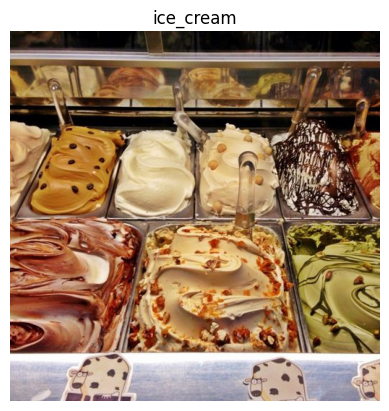

In [85]:
img = view_random_image(train_dir, random.choice(class_names))

In [86]:
# I've noticed that image 1189432 is not a sushi what class claims

In [87]:
os.remove(train_dir + '/sushi/1189432.jpg')

## Preprocess the data

In [88]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Rescale
train_datagen = ImageDataGenerator(rescale = 1 / 255.)
test_datagen = ImageDataGenerator(rescale = 1/ 255.)

# Load data from directory and turn it into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size = 32, # default value
                                               target_size = (224, 224),
                                               class_mode = 'categorical', # default value
                                               shuffle = True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size = 32,
                                             target_size = (224, 224),
                                             class_mode = 'categorical',
                                             shuffle = True)

Found 7499 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


Let's remember that we removed 1 image from train set that was wrongly labeled, that's why we have 7499 images instead of 7500.

## Build a CNN model (start with a baseline)

In [89]:
pip install --upgrade tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [90]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Activation
from tensorflow.keras.optimizers import Adam
import tensorflow

Below is a copy of model from CNN explainer website, since this model also uses 10 classes

In [91]:
model_8 = tensorflow.keras.Sequential([
    Conv2D(filters = 10, kernel_size = 3, input_shape = (224, 224, 3)), # 3 in input_shape means that we have 3 channels of colors which are Red, Green, Blue (RGB)
    Activation(activation = 'relu'), # we can also separate activation function instead of putting activation function within Conv2D layer
    Conv2D(filters = 10, kernel_size = 3),
    Activation(activation = 'relu'),
    MaxPool2D(),
    Conv2D(filters = 10, kernel_size = 3),
    Activation(activation = 'relu'),
    Conv2D(filters = 10, kernel_size = 3),
    Activation(activation = 'relu'),
    MaxPool2D(),
    Flatten(),
    Dense(10),
    Activation(activation = 'softmax')
])

model_8.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(),
    metrics = ['accuracy']
)

history_8 = model_8.fit(
    train_data,
    epochs = 5,
    steps_per_epoch = len(train_data),
    validation_data = test_data,
    validation_steps = len(test_data)
)

Epoch 1/5
235/235 [==============================] - 48s 195ms/step - loss: 2.1362 - accuracy: 0.2199 - val_loss: 2.0111 - val_accuracy: 0.2604
Epoch 2/5
235/235 [==============================] - 43s 183ms/step - loss: 1.8844 - accuracy: 0.3427 - val_loss: 1.8850 - val_accuracy: 0.3384
Epoch 3/5
235/235 [==============================] - 42s 179ms/step - loss: 1.5287 - accuracy: 0.4867 - val_loss: 1.8836 - val_accuracy: 0.3592
Epoch 4/5
235/235 [==============================] - 42s 179ms/step - loss: 0.9939 - accuracy: 0.6782 - val_loss: 2.3212 - val_accuracy: 0.3156
Epoch 5/5
235/235 [==============================] - 42s 179ms/step - loss: 0.4338 - accuracy: 0.8626 - val_loss: 3.0648 - val_accuracy: 0.2980


So if we would randomly guessing we would have 10% chance because we have 10 classes where each of class has same amount of images. Model_1 returns val_accuracy at level 25% which is better than guessing but still weak. However, we established the baseline.

## Evaluating the model

In [92]:
model_8.evaluate(test_data)

79/79 [==============================] - 10s 131ms/step - loss: 3.0648 - accuracy: 0.2980


[3.0647826194763184, 0.2980000078678131]

In [93]:
def plot_loss_accuracy_curves(history):
  """
  Returns separate loss curves for training and validation metrics
  """

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label = 'training_loss')
  plt.plot(epochs, val_loss, label = 'val_loss')
  plt.title('loss')
  plt.xlabel('epochs')
  plt.legend()

  # Plot accuracy
  plt.figure() # this will create a new  plot figure
  plt.plot(epochs, accuracy, label = 'training_accuracy')
  plt.plot(epochs, val_accuracy, label = 'validation_accuracy')
  plt.title('accuracy')
  plt.xlabel('epochs')
  plt.legend()

  plt.show()

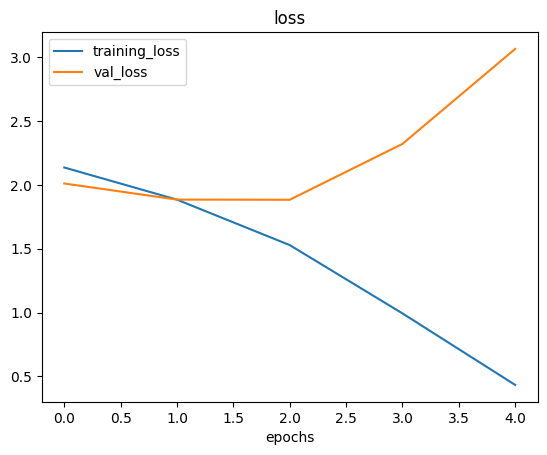

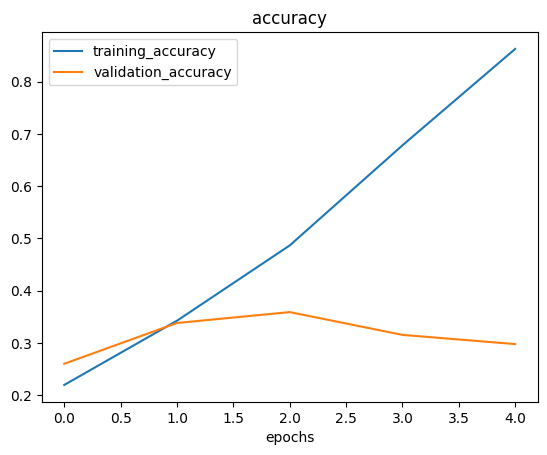

In [94]:
plot_loss_accuracy_curves(history_8)

Since the training loss keeps going down while val loss started to increase that means that we have overfitting

## Adjust the model hyperparameters (to beat the baseline / reduce overfitting)

What we can do for better model performance:

* Get more data
* Simplify the model - if the model is overfitting to reduce it we can simplify our model by reducing layers or reducing hidden units in layers
* Use data augmentation - data augmentation adds more diversity to a training data without altering original dataset
* Use transfer learning - we can leverage on our model by using already existing model that was created for similar dataset as ours

### Simplifying the model

Let's remove 2 convolution layers. We want to achieve higher accuracy and both loss curves of training set and validation set to be closer to each other.

In [95]:
model_9 = Sequential([
    Conv2D(filters = 10, kernel_size = 3, input_shape = (224, 224, 3)), # 3 in input_shape means that we have 3 channels of colors which are Red, Green, Blue (RGB)
    Activation(activation = 'relu'), # we can also separate activation function instead of putting activation function within Conv2D layer
    MaxPool2D(),
    Conv2D(filters = 10, kernel_size = 3),
    Activation(activation = 'relu'),
    MaxPool2D(),
    Flatten(),
    Dense(10),
    Activation(activation = 'softmax')
])

model_9.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(),
    metrics = ['accuracy']
)

history_9 = model_9.fit(
    train_data,
    epochs = 5,
    steps_per_epoch = len(train_data),
    validation_data = test_data,
    validation_steps = len(test_data)
)

Epoch 1/5
235/235 [==============================] - 45s 189ms/step - loss: 2.1034 - accuracy: 0.2452 - val_loss: 2.0298 - val_accuracy: 0.2840
Epoch 2/5
235/235 [==============================] - 42s 181ms/step - loss: 1.7705 - accuracy: 0.3871 - val_loss: 1.8169 - val_accuracy: 0.3680
Epoch 3/5
235/235 [==============================] - 41s 176ms/step - loss: 1.4060 - accuracy: 0.5435 - val_loss: 1.9136 - val_accuracy: 0.3400
Epoch 4/5
235/235 [==============================] - 42s 179ms/step - loss: 0.9179 - accuracy: 0.7189 - val_loss: 2.0262 - val_accuracy: 0.3368
Epoch 5/5
235/235 [==============================] - 41s 175ms/step - loss: 0.4887 - accuracy: 0.8670 - val_loss: 2.4267 - val_accuracy: 0.3280


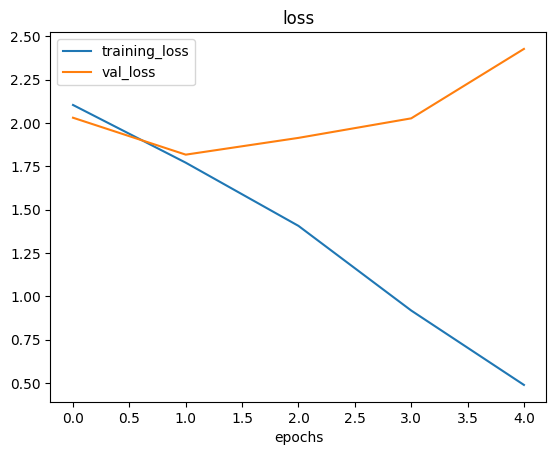

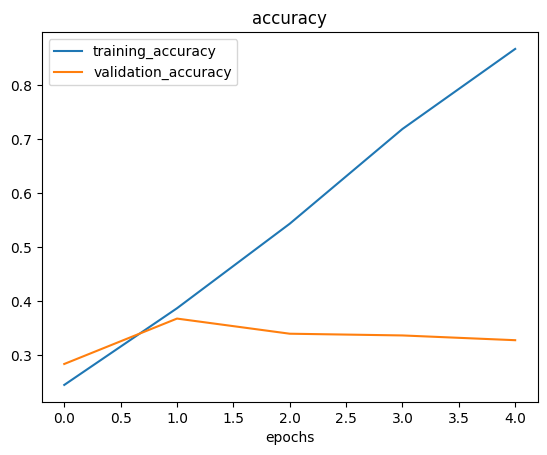

In [96]:
plot_loss_accuracy_curves(history_9)

Well... our experiment wasn't to good. We're still obviously overfitting

In [97]:
model_9.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_19 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 activation_5 (Activation)   (None, 222, 222, 10)      0         
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 111, 111, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 109, 109, 10)      910       
                                                                 
 activation_6 (Activation)   (None, 109, 109, 10)      0         
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 54, 54, 10)       0         
 g2D)                                                 

Now to compare the complexity of the model let's see summary of model_8

In [98]:
model_8.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 activation (Activation)     (None, 222, 222, 10)      0         
                                                                 
 conv2d_16 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 activation_1 (Activation)   (None, 220, 220, 10)      0         
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 110, 110, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 108, 108, 10)      910       
                                                      

So since our new model is not good and overfitting is still present let's use data augmentation

### Data augmentation

Our model_8 performed better so let's train our augmented data on model_8 instead on worst model_9

In [99]:
train_datagen_augmented = ImageDataGenerator(rescale =  1 / 255.,
                                   rotation_range = 0.2,
                                   zoom_range = 0.2,
                                   shear_range = 0.2,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   horizontal_flip = True)

train_data_augmented = train_datagen.flow_from_directory(train_dir,
                                               target_size = (224, 224),
                                               batch_size = 32,
                                               class_mode = 'categorical',
                                               shuffle = True)
from tensorflow.keras.models import clone_model

model_10 = clone_model(model_8) # it clones models architecture

model_10.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(),
    metrics = ['accuracy']
)

history_10 = model_10.fit(
    train_data_augmented,
    epochs = 5,
    steps_per_epoch = len(train_data_augmented),
    validation_data = test_data,
    validation_steps = len(test_data)
)

Found 7499 images belonging to 10 classes.
Epoch 1/5
235/235 [==============================] - 44s 181ms/step - loss: 2.1732 - accuracy: 0.1955 - val_loss: 2.0536 - val_accuracy: 0.2584
Epoch 2/5
235/235 [==============================] - 42s 178ms/step - loss: 1.8627 - accuracy: 0.3496 - val_loss: 1.8670 - val_accuracy: 0.3452
Epoch 3/5
235/235 [==============================] - 42s 178ms/step - loss: 1.3636 - accuracy: 0.5447 - val_loss: 2.0427 - val_accuracy: 0.3140
Epoch 4/5
235/235 [==============================] - 42s 178ms/step - loss: 0.7633 - accuracy: 0.7510 - val_loss: 2.6665 - val_accuracy: 0.2912
Epoch 5/5
235/235 [==============================] - 42s 178ms/step - loss: 0.2927 - accuracy: 0.9100 - val_loss: 3.9729 - val_accuracy: 0.2732


Augmented data takes longer because we augmentes the training data by diverse images

In [100]:
model_10.evaluate(test_data)

79/79 [==============================] - 10s 130ms/step - loss: 3.9729 - accuracy: 0.2732


[3.9728899002075195, 0.27320000529289246]

In [101]:
model_8.evaluate(test_data)

79/79 [==============================] - 10s 131ms/step - loss: 3.0648 - accuracy: 0.2980


[3.06478214263916, 0.2980000078678131]

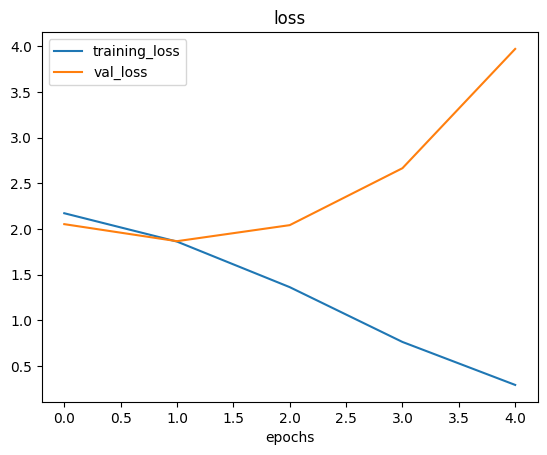

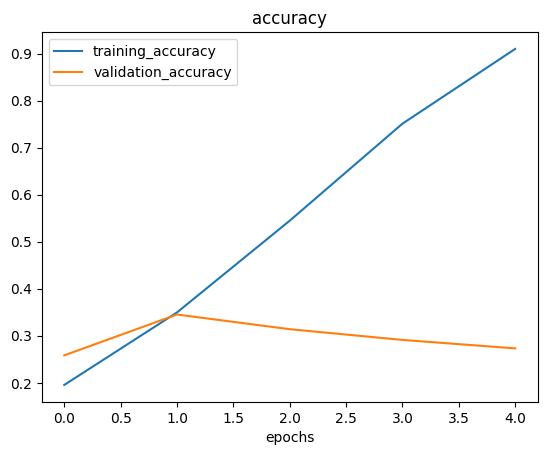

In [102]:
plot_loss_accuracy_curves(history_10)

### Exercise - Best learning rate

In [103]:
history_10.history['loss']

[2.173153877258301,
 1.8627030849456787,
 1.363576889038086,
 0.7633044719696045,
 0.2926673889160156]

Text(0.5, 1.0, 'Finding the ideal learning rate')

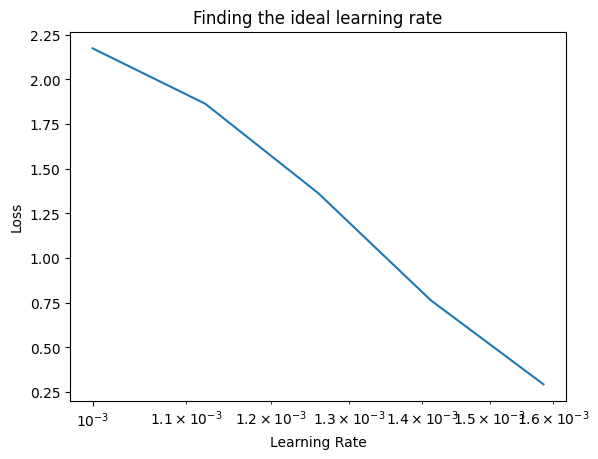

In [104]:
import matplotlib.pyplot as plt

lrs = 1e-3 * (10 ** (tf.range(5)/20))
plt.semilogx(lrs, history_10.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss')
plt.title('Finding the ideal learning rate')

Best learning rate is 0.001

## Making predictions on custom images

### Pred_and_plot for multiclass classification

In [105]:
def pred_and_plot(model, filename, class_names = class_names):
  """
  Imports and image located in filename, makes a prediction with model
  and plots the image with the predicted class and title
  """
  # Import the targeted image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model_7.predict(tf.expand_dims(img, axis = 0))

  # # Get the predicted class
  if len(pred[0]) > 1:       # Binary classification uses sigmoid function whitch returns 1 number, when it comes to softmax, thus multi-class classification returns multiple probabilities, each for one class
    pred_class = class_names[tf.argmax(pred[0])]
  else:
    pred_class = class_names[int(tf.round(pred))]

  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False)

In [106]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [107]:
!wget 'https://staticsmaker.iplsc.com/smaker_prod_2021_05_24/67fda82827f1690611fc97b4ab777f17-recipe_main.jpg'
!wget 'https://www.licious.in/blog/wp-content/uploads/2020/12/Chicken-Curry-recipe.jpg'
!wget 'https://static.fajnegotowanie.pl/media/uploads/media_image/original/przepis/811/ramen.jpg'
!wget 'https://www.seriouseats.com/thmb/WzQz05gt5witRGeOYKTcTqfe1gs=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/butter-basted-pan-seared-steaks-recipe-hero-06-03b1131c58524be2bd6c9851a2fbdbc3.jpg'

--2023-05-09 18:47:49--  https://staticsmaker.iplsc.com/smaker_prod_2021_05_24/67fda82827f1690611fc97b4ab777f17-recipe_main.jpg
Resolving staticsmaker.iplsc.com (staticsmaker.iplsc.com)... 217.74.71.49
Connecting to staticsmaker.iplsc.com (staticsmaker.iplsc.com)|217.74.71.49|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 69077 (67K) [image/jpeg]
Saving to: ‘67fda82827f1690611fc97b4ab777f17-recipe_main.jpg’

67fda82827f1690611f 100%[===================>]  67.46K   155KB/s    in 0.4s    

2023-05-09 18:47:50 (155 KB/s) - ‘67fda82827f1690611fc97b4ab777f17-recipe_main.jpg’ saved [69077/69077]

--2023-05-09 18:47:50--  https://www.licious.in/blog/wp-content/uploads/2020/12/Chicken-Curry-recipe.jpg
Resolving www.licious.in (www.licious.in)... 104.18.27.155, 104.18.26.155, 2606:4700::6812:1a9b, ...
Connecting to www.licious.in (www.licious.in)|104.18.27.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 266375 (260K) [image/jpeg]
Saving t

1/1 [==============================] - 0s 18ms/step


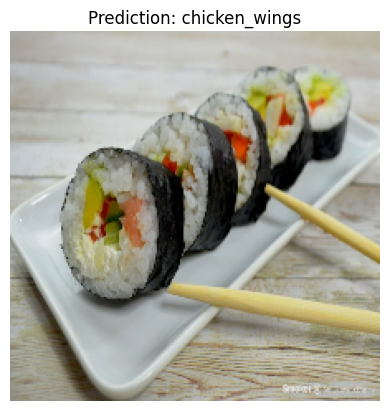

In [108]:
pred_and_plot(model_10, '67fda82827f1690611fc97b4ab777f17-recipe_main.jpg')

1/1 [==============================] - 0s 18ms/step


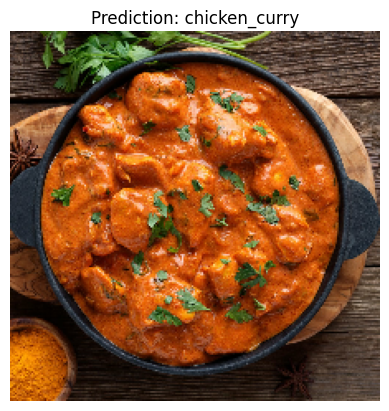

In [109]:
pred_and_plot(model_10, 'Chicken-Curry-recipe.jpg')

1/1 [==============================] - 0s 18ms/step


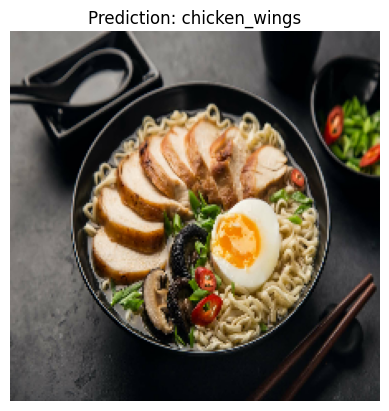

In [110]:
pred_and_plot(model_10, 'ramen.jpg')

1/1 [==============================] - 0s 18ms/step


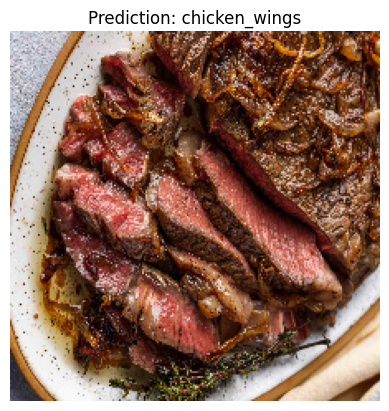

In [111]:
pred_and_plot(model_10, 'butter-basted-pan-seared-steaks-recipe-hero-06-03b1131c58524be2bd6c9851a2fbdbc3.jpg')

Model performs really bad. To improve it we might to try transfer learning. Before that let's save the model.

## Save the model

In [112]:
model_10.save('saved_trained_model_10')

Download the model to the desktop

In [113]:
!zip -r ./saved_trained_model_10_.zip ./saved_trained_model_10/

  adding: saved_trained_model_10/ (stored 0%)
  adding: saved_trained_model_10/variables/ (stored 0%)
  adding: saved_trained_model_10/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: saved_trained_model_10/variables/variables.index (deflated 65%)
  adding: saved_trained_model_10/saved_model.pb (deflated 89%)
  adding: saved_trained_model_10/assets/ (stored 0%)
  adding: saved_trained_model_10/keras_metadata.pb (deflated 92%)
  adding: saved_trained_model_10/fingerprint.pb (stored 0%)


In [114]:
from google.colab import files
files.download("/content/saved_trained_model_10")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

after loading earlier saved model we should receive two same evaluation metrics for loaded and pre-saved model. There might be very minor differencies due to way how computer storages the data, however it shouldn't be significant difference.

In [115]:
loaded_model_10 = tf.keras.models.load_model('saved_trained_model_10')
loaded_model_10.evaluate(test_data)

79/79 [==============================] - 11s 131ms/step - loss: 3.9729 - accuracy: 0.2732


[3.9728899002075195, 0.27320000529289246]

In [116]:
model_10.evaluate(test_data)

79/79 [==============================] - 10s 131ms/step - loss: 3.9729 - accuracy: 0.2732


[3.9728899002075195, 0.27320000529289246]

# Exercises

## Upload

In [134]:
import zipfile

# Unzip the downloaded file
zip_ref = zipfile.ZipFile('Exercise - pretzel or chips.zip')
zip_ref.extractall()
zip_ref.close()

## EDA

In [135]:
!ls "Exercise - pretzel or chips"

Chips  Pretzels


In [136]:
!ls "Exercise - pretzel or chips/Chips"

IMG-4593.jpg  IMG-4594.jpg  IMG-4595.jpg  IMG-4596.jpg	IMG-4597.jpg


In [137]:
!ls "Exercise - pretzel or chips/Pretzels"

IMG-4598.jpg  IMG-4599.jpg  IMG-4600.jpg  IMG-4601.jpg	IMG-4602.jpg


In [138]:
import os 

# wlakt through pizza_steak dir and list number of files

for dirpath, dirnames, filenames in os.walk("Exercise - pretzel or chips"):
  print(f"there are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

there are 2 directories and 1 images in 'Exercise - pretzel or chips'.
there are 0 directories and 5 images in 'Exercise - pretzel or chips/Pretzels'.
there are 0 directories and 5 images in 'Exercise - pretzel or chips/Chips'.


In [139]:
import pathlib
import numpy as np
data_dir = pathlib.Path('Exercise - pretzel or chips')
class_names = np.array(sorted([item.name for item in data_dir.glob('*')])) # created a list of class_names from the subdirectory
class_names = class_names[1:]
class_names

array(['Chips', 'Pretzels'], dtype='<U9')

In [140]:
# Visuzalization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir, target_class):
  # Setup the target directory
  target_folder = target_dir + '/' + target_class

  # Get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)

  # Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder + '/' + random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis('off');

  print(f'Image name: {random_image[0]}')
  print(f'Image shape: {img.shape}') # show the shape of the image

  return img

Image name: IMG-4597.jpg
Image shape: (3024, 4032, 3)


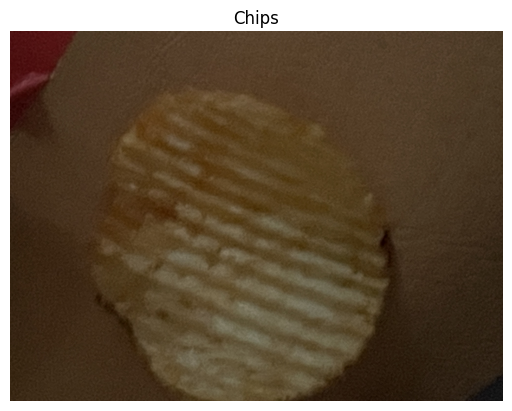

In [141]:
img = view_random_image('Exercise - pretzel or chips', 'Chips')

Image name: IMG-4600.jpg
Image shape: (3024, 4032, 3)


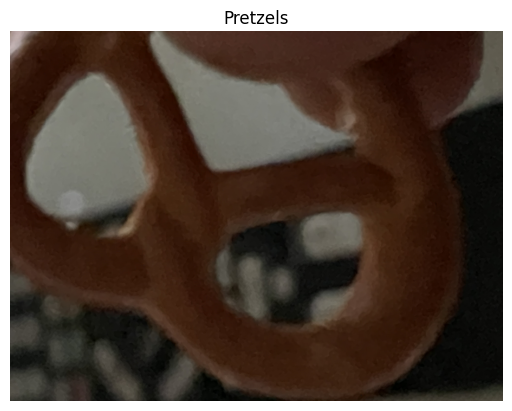

In [142]:
img = view_random_image('Exercise - pretzel or chips', 'Pretzels')

## Normalization

In [143]:
import tensorflow as tf
img_vectors = tf.constant(img)
img_vectors

<tf.Tensor: shape=(3024, 4032, 3), dtype=uint8, numpy=
array([[[142, 122, 113],
        [143, 123, 114],
        [145, 125, 116],
        ...,
        [ 93,  89,  78],
        [ 93,  89,  78],
        [ 93,  89,  78]],

       [[142, 122, 113],
        [143, 123, 114],
        [145, 125, 116],
        ...,
        [ 94,  90,  79],
        [ 94,  90,  79],
        [ 93,  89,  78]],

       [[143, 123, 114],
        [144, 124, 115],
        [145, 125, 116],
        ...,
        [ 94,  90,  79],
        [ 94,  90,  79],
        [ 94,  90,  79]],

       ...,

       [[ 52,  51,  46],
        [ 52,  51,  46],
        [ 52,  51,  46],
        ...,
        [ 76,  72,  61],
        [ 76,  72,  61],
        [ 76,  72,  61]],

       [[ 51,  50,  45],
        [ 52,  51,  46],
        [ 52,  51,  46],
        ...,
        [ 76,  72,  61],
        [ 76,  72,  61],
        [ 76,  72,  61]],

       [[ 51,  50,  45],
        [ 51,  50,  45],
        [ 52,  51,  46],
        ...,
        [ 76,  72, 

In [144]:
img/255.

array([[[0.55686275, 0.47843137, 0.44313725],
        [0.56078431, 0.48235294, 0.44705882],
        [0.56862745, 0.49019608, 0.45490196],
        ...,
        [0.36470588, 0.34901961, 0.30588235],
        [0.36470588, 0.34901961, 0.30588235],
        [0.36470588, 0.34901961, 0.30588235]],

       [[0.55686275, 0.47843137, 0.44313725],
        [0.56078431, 0.48235294, 0.44705882],
        [0.56862745, 0.49019608, 0.45490196],
        ...,
        [0.36862745, 0.35294118, 0.30980392],
        [0.36862745, 0.35294118, 0.30980392],
        [0.36470588, 0.34901961, 0.30588235]],

       [[0.56078431, 0.48235294, 0.44705882],
        [0.56470588, 0.48627451, 0.45098039],
        [0.56862745, 0.49019608, 0.45490196],
        ...,
        [0.36862745, 0.35294118, 0.30980392],
        [0.36862745, 0.35294118, 0.30980392],
        [0.36862745, 0.35294118, 0.30980392]],

       ...,

       [[0.20392157, 0.2       , 0.18039216],
        [0.20392157, 0.2       , 0.18039216],
        [0.20392157, 0

## Model

In [154]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# set the seed
tf.random.set_seed(42)

# Preprocessing data (get all of the pixel values between 0 & 1, scalling)
train_datagen = ImageDataGenerator(rescale = 1./255)

# Setup paths to our data directories
train_dir = '/content/Exercise - pretzel or chips'

# Import data from directories and turn it into batches
train_data = train_datagen.flow_from_directory(directory = train_dir, 
                                               batch_size = 5,
                                               target_size = (224, 224),  # will reshape all images to given shape
                                               class_mode = 'binary',
                                               seed = 42) 


model_1 = tf.keras.models.Sequential([
     tf.keras.layers.RandomFlip(
                                "horizontal",
                                input_shape = (224, 224, 3)
     ),
     tf.keras.layers.RandomRotation(0.1),
     tf.keras.layers.RandomZoom(0.1),
     tf.keras.layers.Conv2D(filters = 10,
                            kernel_size = 3,
                            activation = 'relu',
                            input_shape = (224, 224, 3)),
     tf.keras.layers.Conv2D(10, 3, activation = 'relu'), # this layer is exactly the same as the one above, just uses deafult values and args
     tf.keras.layers.Dropout(0.2),
     tf.keras.layers.Flatten(),
     tf.keras.layers.Dense(1, activation = 'sigmoid')

 ])

# Compile our CNN

model_1.compile(
    loss = 'binary_crossentropy',
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ['accuracy']
)

# Fit
history_1 = model_1.fit(
    train_data,
    epochs = 15,
    steps_per_epoch = len(train_data),
)

Found 10 images belonging to 2 classes.
Epoch 1/15
2/2 [==============================] - 3s 240ms/step - loss: 9.2148 - accuracy: 0.5000
Epoch 2/15
2/2 [==============================] - 1s 706ms/step - loss: 7.3834 - accuracy: 0.4000
Epoch 3/15
2/2 [==============================] - 1s 721ms/step - loss: 3.2758 - accuracy: 0.5000
Epoch 4/15
2/2 [==============================] - 1s 642ms/step - loss: 3.2843 - accuracy: 0.5000
Epoch 5/15
2/2 [==============================] - 1s 686ms/step - loss: 3.1626 - accuracy: 0.5000
Epoch 6/15
2/2 [==============================] - 1s 709ms/step - loss: 1.3360 - accuracy: 0.5000
Epoch 7/15
2/2 [==============================] - 1s 746ms/step - loss: 0.6553 - accuracy: 0.7000
Epoch 8/15
2/2 [==============================] - 1s 644ms/step - loss: 1.0997 - accuracy: 0.5000
Epoch 9/15
2/2 [==============================] - 1s 621ms/step - loss: 0.6434 - accuracy: 0.6000
Epoch 10/15
2/2 [==============================] - 1s 640ms/step - loss: 0.354

## Evaluation

<Axes: >

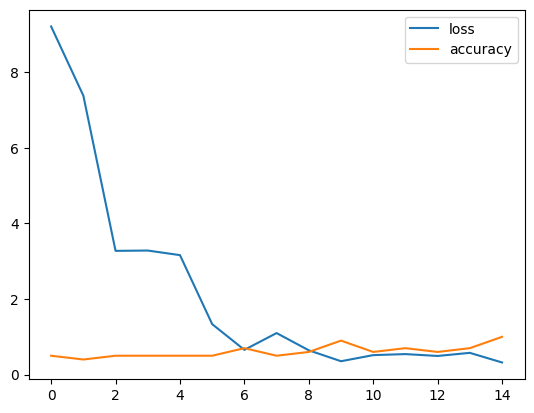

In [155]:
import pandas as pd
pd.DataFrame(history_1.history).plot()

## Prediction

In [147]:
def load_and_prep_image(filename, img_shape = 224):
  """
  Reads an image from an output and turns it into tensor and reshapes it
  to (img_shape, img_shape, colour_channels)
  """

  # Read in the image
  img = tf.io.read_file(filename)
  # Decode the read file into image
  img = tf.image.decode_image(img)
  # Changes shape of image tensor into desired shape
  img = tf.image.resize(img, size = [img_shape, img_shape])
  # Rescaling
  img = img / 255.

  return img

def pred_and_plot(model, filename, class_names = class_names):
  """
  Imports and image located in filename, makes a prediction with model
  and plots the image with the predicted class and title
  """
  # Import the targeted image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model.predict(tf.expand_dims(img, axis = 0))

  # Get the predicted class
  pred_class = class_names[int(tf.round(pred))]

  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False)

1/1 [==============================] - 0s 52ms/step


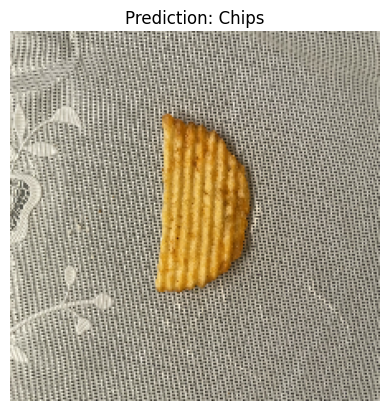

In [156]:
pred_and_plot(model_1, 'image_50386177.JPG', class_names)

1/1 [==============================] - 0s 18ms/step


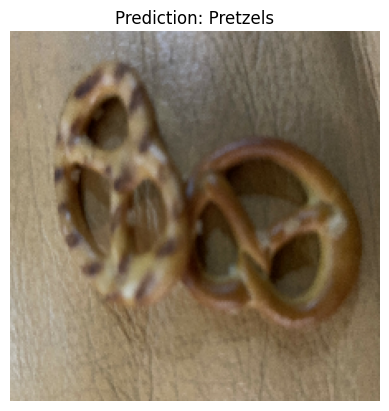

In [157]:
pred_and_plot(model_1, 'IMG_4606.jpg', class_names)

All our answers are correct, however model should be trained and tested on more data to be trully efficient. 